In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

import matplotlib.pyplot as plt
import numpy as np
import random

from PIL import Image

import math

In [ ]:
PATH = './data/'
batch_size =64
workers = 2
epochs = 100

latent_size=100
K = 10 

gf_dim = 32
df_dim = 32

in_h = 28
in_w = 28
c_dim = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

manualSeed = 3734
print("Random Seed: ",manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed) 

Random Seed:  3734


In [ ]:
transform = transforms.Compose(
    [
     transforms.Resize((in_h,in_w)),
     transforms.ToTensor(),
     transforms.Normalize((0.5,),(0.5,)),
     ]
)

transform_inverse=torchvision.transforms.Normalize((-1,-1,-1),(2,2,2))

def batch_transform_inverse(y):
  x = y.new(*y.size())
  if y.size()[1]==1:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
  else:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
    x[:, 1, :, :] = y[:, 1, :, :] * 2 - 1 
    x[:, 2, :, :] = y[:, 2, :, :] * 2 - 1
  return x

In [ ]:
train_set = torchvision.datasets.MNIST(root=PATH,train=True,
                                      download=True,transform=transform)
train_loader = torch.utils.data.DataLoader(train_set,batch_size=batch_size,
                                          shuffle =True, num_workers=workers)

test_set = torchvision.datasets.MNIST(root=PATH,train=False,
                                     download=True, transform=transform)

test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch_size,
                                          shuffle = False, num_workers=workers)

train_iter = iter(train_loader)
test_iter = iter(test_loader)

torch.Size([64, 1, 28, 28])


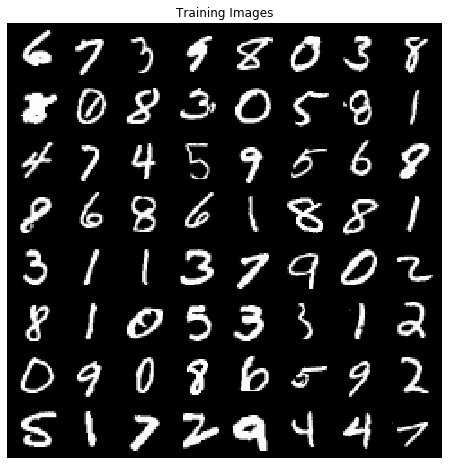

In [ ]:
real_batch, labels = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64],padding=2, normalize=True).cpu(),(1,2,0)))

print(real_batch.size())

In [ ]:
def conv_bn_lrelu_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
        nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
        nn.LeakyReLU(0.2)
    )
def conv_bn_lrelu_drop_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
        nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.5)
    )
def tconv_bn_relu_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.Sequential(
      nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
      nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
      nn.ReLU()
  )

def tconv_bn_lrelu_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.Sequential(
      nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
      nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
      nn.ReLU()
  )
  
def tconv_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding)

def conv_lrelu_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.Sequential(
      nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
      nn.LeakyReLU(0.2)
  )

def conv_lrelu_drop_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
  return nn.Sequential(
      nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
      nn.LeakyReLU(0.2)
  )

def fc_bn_layer(in_features,out_features):
  return nn.Sequential(
      nn.Linear(in_features,out_features),
      nn.BatchNorm1d(out_features)
  )

def fc_layer(in_features,out_features):
  return nn.Linear(in_features,out_features)


In [ ]:
def conv_out_size_same(size, stride):
  return int(math.ceil(float(size) / float(stride)))
s_h, s_w = in_h, in_w
s_h2, s_w2 = conv_out_size_same(s_h, 2), conv_out_size_same(s_w, 2)
s_h4, s_w4 = conv_out_size_same(s_h2, 2), conv_out_size_same(s_w2, 2)
s_h8, s_w8 = conv_out_size_same(s_h4, 2), conv_out_size_same(s_w4, 2)
print(s_h4)
print(s_h8)

7
4


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class G(nn.Module):
  def __init__(self):
    super(G,self).__init__()
    self.fc_layer1 = fc_layer(latent_size,s_h8*s_w8*gf_dim*4)
    self.bn_layer1 = nn.BatchNorm2d(gf_dim*4)#4x4
    self.up_sample_layer2 = tconv_bn_relu_layer(gf_dim*4,gf_dim*2,3,stride=2,padding=1)#7x7
    self.up_sample_layer3 = tconv_bn_relu_layer(gf_dim*2,gf_dim,4,stride=2,padding=1)#14x14
    self.up_sample_layer4 = tconv_layer(gf_dim,c_dim,4,stride=2,padding=1)#28x28
    self.tanh = nn.Tanh()


  def forward(self, x):
    x = self.fc_layer1(x)
    x = x.view(-1,gf_dim*4,s_h8,s_w8)
    x = self.bn_layer1(x)
    x = self.up_sample_layer2(x)
    x = self.up_sample_layer3(x)
    x = self.up_sample_layer4(x)
    x = self.tanh(x)
    return x

In [ ]:
class D(nn.Module):
  def __init__(self):
    super(D,self).__init__()
    self.down_sample_layer1 = conv_lrelu_layer(c_dim,df_dim,4,stride=2,padding=1)# 14x14
    self.down_sample_layer2 = conv_bn_lrelu_layer(df_dim,df_dim*2,4,stride=2,padding=1)#7x7
    self.down_sample_layer3 = conv_bn_lrelu_layer(df_dim*2,df_dim*4,3,stride=2,padding=1)
    self.fc_layer4 = fc_layer(df_dim*4*s_h8*s_w8,K)
    self.softmax = nn.Softmax(dim=-1)

  def forward(self, x):
    x = self.down_sample_layer1(x)
    x = self.down_sample_layer2(x)
    x = self.down_sample_layer3(x)
    x = torch.flatten(x,1)
    x = self.fc_layer4(x)
    x = self.softmax(x)

    return x


In [ ]:
class MarginalHLoss(nn.Module):
  def __init__(self):
    super(MarginalHLoss, self).__init__()
  def forward(self, x):# NxK
    x = x.mean(axis=0)
    x = -torch.sum(x*torch.log(x+1e-6))
    return x

class JointHLoss(nn.Module):
  def __init__(self):
    super(JointHLoss, self).__init__()
  def forward(self, x):
    x = -x*torch.log(x+1e-6)
    x = 1.0/batch_size*x.sum()
    return x


In [ ]:
import torch.optim as optim

G_net = G().to(device)
D_net = D().to(device)

jointH = JointHLoss()
marginalH = MarginalHLoss()

G_optimizer = optim.Adam(G_net.parameters(),lr=1e-4,betas=(0.5,0.9))
D_optimizer = optim.Adam(D_net.parameters(),lr=1e-4,betas=(0.5,0.9))


fixed_noise = torch.randn(batch_size, latent_size,device=device)

In [ ]:
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv')!=-1:
    nn.init.xavier_normal_(m.weight) 
    # nn.init.constant_(m.bias.data,0.0) 

  elif classname.find('Linear')!=-1:
    nn.init.normal_(m.weight.data,0.0,0.01)
    nn.init.constant_(m.bias.data,0.0) 

  elif classname.find('BatchNorm')!=-1:
    nn.init.normal_(m.weight.data,1.0,0.02)
    nn.init.constant_(m.bias.data,0.0)

print(G_net.apply(weights_init))
print(D_net.apply(weights_init))

G(
  (fc_layer1): Linear(in_features=100, out_features=2048, bias=True)
  (bn_layer1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up_sample_layer2): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (up_sample_layer3): Sequential(
    (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (up_sample_layer4): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (tanh): Tanh()
)
D(
  (down_sample_layer1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
  )
  (down_sample_layer2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1,

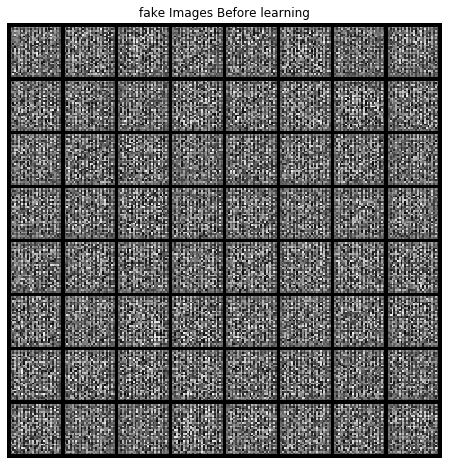

In [ ]:
with torch.no_grad():
  fake_batch=G_net(fixed_noise)
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('fake Images Before learning')
plt.imshow(np.transpose(vutils.make_grid(fake_batch.to(device)[:64].view(64,c_dim,in_h,in_w),padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
img_list = []
G_losses = []
D_losses = []
iter_per_plot = 500


In [ ]:
for ep in range(epochs):
  for i, (data, _) in enumerate(train_loader):
    b_size=data.shape[0] 

    data = data.to(device=device)

    #Train D

    D_net.zero_grad()

    y_real = D_net(data)
    joint_entropy_real = jointH(y_real)#minimize uncertainty

    marginal_entropy_real = marginalH(y_real)#maximize uncertainty

    z = torch.randn(b_size,latent_size).to(device=device)#uniform distribution sampling
    fake_images = G_net(z)
    y_fake = D_net(fake_images.detach())

    joint_entropy_fake = jointH(y_fake)#maximize uncertainty

    loss_D = joint_entropy_real - marginal_entropy_real - joint_entropy_fake
    loss_D.backward(retain_graph=True)
    D_optimizer.step()

    #Train G

    G_net.zero_grad()
    y_fake = D_net(fake_images)
    marginal_entropy_fake = marginalH(y_fake)#maximize uncertainty
    joint_entropy_fake = jointH(y_fake)#maximize uncertainty

    loss_G = joint_entropy_fake-marginal_entropy_fake

    loss_G.backward(retain_graph=True)
    G_optimizer.step()
    

    if (i+1)%iter_per_plot == 0 or i ==0:
      print('Epoch [{}/{}], Step [{}/{}] \n D_loss: {:.4f}, H_x[p(y|D)] : {:.4f}, E[H[p(y|x,D)]] : {:.4f}, E[H[p(y|G(z),D)]]:{:.4f}\n G_loss: {:.4f}, H_G[p(y|D)] : {:.4f}, E[H[p(y|G(z),D)]]: {:.4f}' 
            .format(ep, epochs, i+1, len(train_loader), loss_D.item(), marginal_entropy_real.item(), joint_entropy_real.item(),joint_entropy_fake.item(),loss_G.item(),marginal_entropy_fake.item(),joint_entropy_fake.item()))
      G_losses.append(loss_G.item())
      D_losses.append(loss_D.item())
      with torch.no_grad():
          fake = G_net(fixed_noise).detach().cpu()
          img_list.append(vutils.make_grid(torch.reshape(fake,(b_size,c_dim,in_h,in_w))[:64], padding=2, normalize=True))
          transform_PIL=transforms.ToPILImage()
          transform_PIL(img_list[-1]).save(str(ep)+"CATGAN_MNIST_Last.png")


Epoch [0/100], Step [1/938] 
 D_loss: -2.2609, H_x[p(y|D)] : 2.2780, E[H[p(y|x,D)]] : 2.2548, E[H[p(y|G(z),D)]]:2.2377
 G_loss: -0.0308, H_G[p(y|D)] : 2.2685, E[H[p(y|G(z),D)]]: 2.2377
Epoch [0/100], Step [500/938] 
 D_loss: -3.7238, H_x[p(y|D)] : 2.0710, E[H[p(y|x,D)]] : 0.4541, E[H[p(y|G(z),D)]]:2.1070
 G_loss: -0.1896, H_G[p(y|D)] : 2.2966, E[H[p(y|G(z),D)]]: 2.1070
Epoch [1/100], Step [1/938] 
 D_loss: -3.4080, H_x[p(y|D)] : 2.1558, E[H[p(y|x,D)]] : 0.6967, E[H[p(y|G(z),D)]]:1.9488
 G_loss: -0.3169, H_G[p(y|D)] : 2.2658, E[H[p(y|G(z),D)]]: 1.9488
Epoch [1/100], Step [500/938] 
 D_loss: -3.4019, H_x[p(y|D)] : 2.1676, E[H[p(y|x,D)]] : 0.6326, E[H[p(y|G(z),D)]]:1.8669
 G_loss: -0.4140, H_G[p(y|D)] : 2.2809, E[H[p(y|G(z),D)]]: 1.8669
Epoch [2/100], Step [1/938] 
 D_loss: -3.1999, H_x[p(y|D)] : 2.2597, E[H[p(y|x,D)]] : 0.9125, E[H[p(y|G(z),D)]]:1.8527
 G_loss: -0.4135, H_G[p(y|D)] : 2.2663, E[H[p(y|G(z),D)]]: 1.8527
Epoch [2/100], Step [500/938] 
 D_loss: -3.4762, H_x[p(y|D)] : 2.1936, 

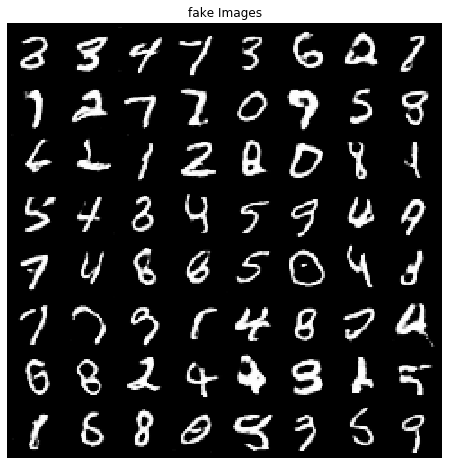

In [ ]:
with torch.no_grad():
  fake_batch=G_net(fixed_noise)
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('fake Images')
plt.imshow(np.transpose(vutils.make_grid(fake_batch.to(device)[:64].view(64,c_dim,in_h,in_w),padding=2, normalize=True).cpu(),(1,2,0)))

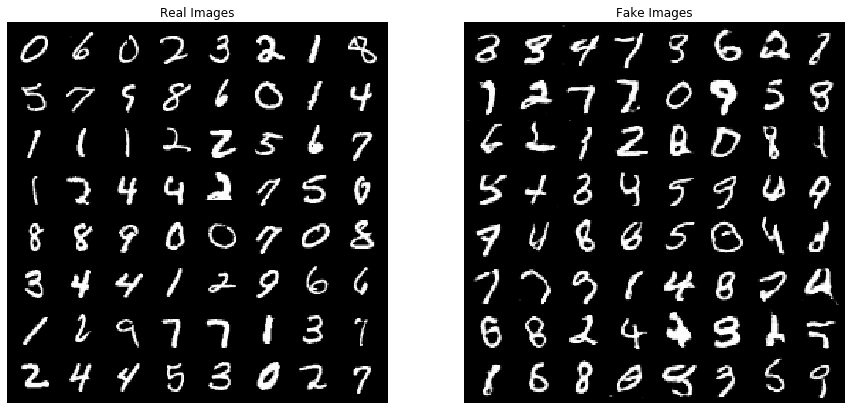

In [ ]:
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

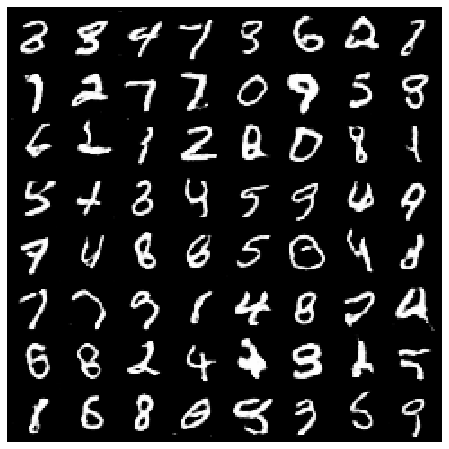

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
transform_PIL=transforms.ToPILImage()

p_img_list = [transform_PIL(p_image) for p_image in img_list]
p_img_list[0].save('CATGAN_MNIST.gif', save_all=True,append_images=p_img_list[1:], optimize=False, duration=0.1, loop=0)

In [ ]:
p_img_list[-1].save("CATGAN_MNIST_Last.png")

In [ ]:
def show_category_image(image_batch,category,k):
  cnt=0
  for i, cat in enumerate(category):
    if cat==k:
      cnt+=1
      plt.imshow(image_batch[i],cmap='gray')
      plt.pause(0.001)
    if cnt == 10:
      break

In [ ]:
with torch.no_grad():
  random_noise=torch.randn(200,latent_size,device=device)
  fake_batch = G_net(random_noise)
  category_fake=D_net(fake_batch).argmax(axis=1).cpu().numpy()
fake_batch=batch_transform_inverse(fake_batch).squeeze().cpu()


real_batch, _ = next(iter(train_loader))
real_batch = real_batch.to(device=device)
with torch.no_grad():
  category_real=D_net(real_batch).argmax(axis=1).cpu().numpy()
real_batch=batch_transform_inverse(real_batch).squeeze().cpu()


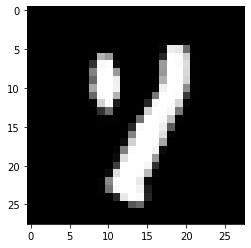

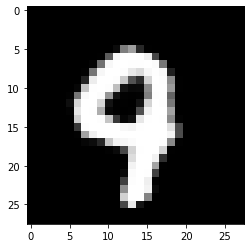

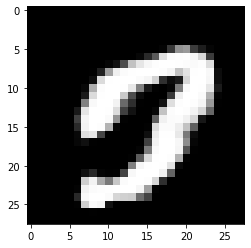

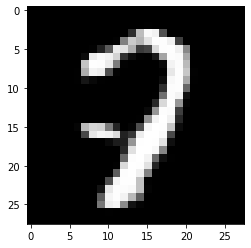

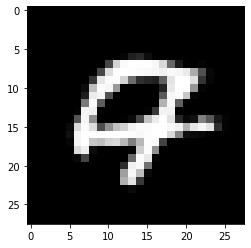

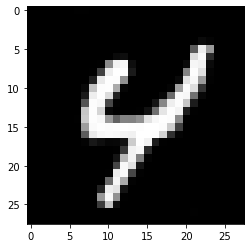

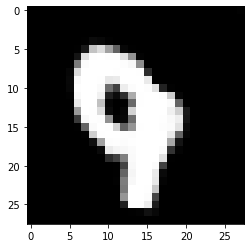

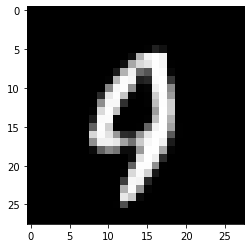

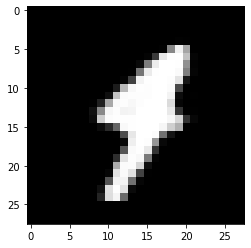

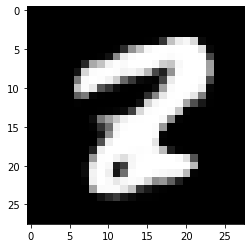

In [ ]:
show_category_image(fake_batch,category_fake,0)

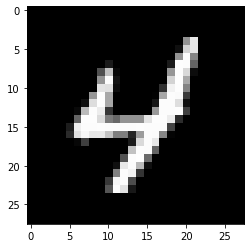

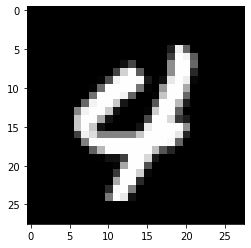

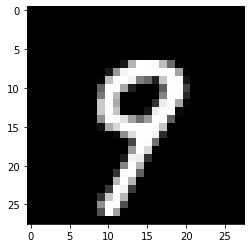

In [ ]:
show_category_image(real_batch,category_real,0)

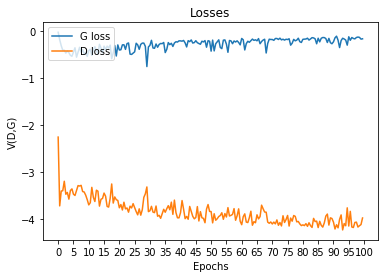

In [ ]:
plot_per_eps=(int(len(train_loader)/iter_per_plot)+1)

plt.title("Losses")
epsilon = 1/plot_per_eps
X = np.array(range(plot_per_eps*epochs))/plot_per_eps

plt.plot(X,G_losses,label="G loss")
plt.plot(X,D_losses,label="D loss")
plt.legend(loc=2)
plt.xticks(np.arange(0,epochs+1,5)) 
plt.ylabel("V(D,G)")
plt.xlabel("Epochs")
#plt.show()
plt.savefig("CatGAN_figure.png")

In [ ]:
torch.save(G_net.state_dict(),"./G_CATGAN.pth")

In [ ]:
G_net.load_state_dict(torch.load('G_CATGAN.pth'))

<All keys matched successfully>

In [ ]:
torch.save(D_net.state_dict(),"./D_CATGAN.pth")

In [ ]:
D_net.load_state_dict(torch.load('D_CATGAN.pth'))

<All keys matched successfully>